<a href="https://colab.research.google.com/github/YYC-CHUAN/dip-CTuse/blob/main/Denoising.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


**Code for "Blind restoration of a JPEG-compressed image" and "Blind image denoising" figures.**



In [ ]:
!git clone https://github.com/YYC-CHUAN/dip-CTuse.git
!mv dip-CTuse/* ./

Cloning into 'dip-CTuse'...
remote: Enumerating objects: 384, done.
remote: Counting objects: 100% (69/69), done.
remote: Compressing objects: 100% (62/62), done.
remote: Total 384 (delta 48), reused 7 (delta 7), pack-reused 315 (from 2)
Receiving objects: 100% (384/384), 7.62 MiB | 30.95 MiB/s, done.
Resolving deltas: 100% (135/135), done.


# Import libs

In [ ]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline
0
import os
#os.environ['CUDA_VISIBLE_DEVICES'] = '3'


import numpy as np
from models import *

import torch
import torch.optim


from skimage.metrics import peak_signal_noise_ratio as compare_psnr
from utils.denoising_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

imsize =-1
PLOT = True
sigma = 25
sigma_ = sigma/255.

In [ ]:
import skimage.measure

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
fname = 'data-new/Denoising/Compression artifact/8kb.png'

# Add guassian_noise to image

<class 'numpy.ndarray'>
(512, 512, 3)
uint8


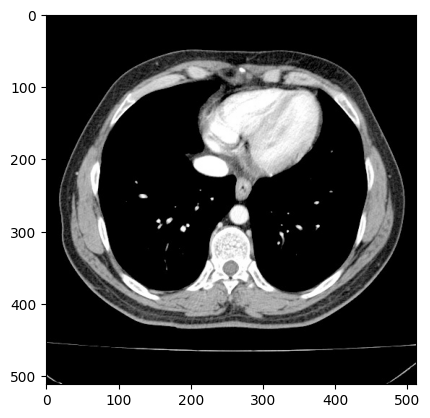

In [ ]:
image=plt.imread('data-new/Denoising/original.jpg');
print(type(image))  #图片种类
print(image.shape)  #打印图片大小
print(image.dtype)  #打印图片数据类型
plt.imshow(image)
plt.show()


<class 'numpy.ndarray'>
(512, 512, 3)
uint8


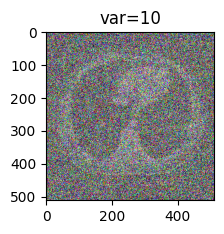

In [ ]:
from skimage.util import random_noise #添加噪声模块
import matplotlib.pyplot as plt

image=plt.imread('data-new/Denoising/original.jpg');
print(type(image))  #图片种类
print(image.shape)  #打印图片大小
print(image.dtype)  #打印图片数据类型
plt.subplot(2,2,1)
plt.title('origin')
plt.imshow(image)

noise_gaussian_1=random_noise(image,mode="gaussian",clip=True)
noise_gaussian_2=random_noise(image,mode="gaussian",var=1,clip=True)
noise_gaussian_3=random_noise(image,mode="gaussian",var=10,clip=True)

'''
plt.subplot(2,2,2)
plt.title('var=0.01')
plt.imshow(noise_gaussian_1)
plt.subplot(2,2,3)

plt.title('var=1')
plt.imshow(noise_gaussian_2)
plt.subplot(2,2,4)
'''
plt.title('var=10')
plt.imshow(noise_gaussian_3)
plt.show()


# Load image

512


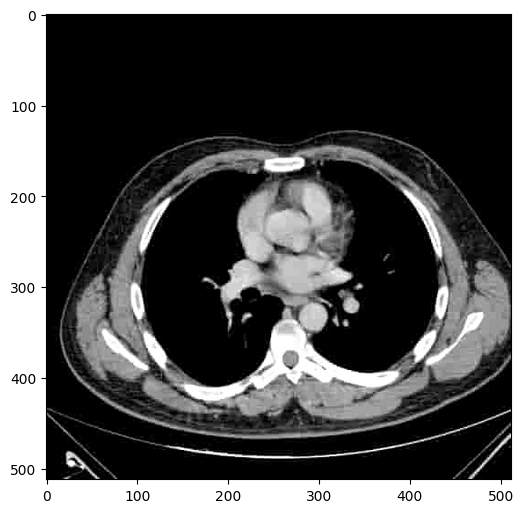

In [ ]:
# if fname == 'data/denoising/F16_GT.png':
if fname == 'data-new/Denoising/Compression artifact/8kb.png':
    img_noisy_pil = crop_image(get_image(fname, imsize)[0], d=32)
    img_noisy_np = pil_to_np(img_noisy_pil)

    # As we don't have ground truth
    img_pil = img_noisy_pil
    img_np = img_noisy_np

    channels = img_np.shape[-1]
    print(channels)

    if PLOT:
        plot_image_grid([img_np], 4, 5);

elif fname == 'data/denoising/snail.jpg':
    # Add synthetic noise
    img_pil = crop_image(get_image(fname, imsize)[0], d=32)
    img_np = pil_to_np(img_pil)

    img_noisy_pil, img_noisy_np = get_noisy_image(img_np, sigma_)

    if PLOT:
        plot_image_grid([img_np, img_noisy_np], 4, 6);
else:
    assert False

# Setup

In [ ]:
INPUT = 'noise'
pad = 'reflection'
OPT_OVER = 'net' # 'net,input'

reg_noise_std = 1./30. # set to 1./20. for sigma=50
LR = 0.01

OPTIMIZER= 'LBFGS'  # 'adam'
OPTIMIZER= 'adam'  # 'LBFGS'
show_every = 100
exp_weight=0.99

if fname == 'data/denoising/snail.jpg':
    num_iter = 2400

    input_depth = 3

    figsize = 5
    net = skip(
                input_depth, 3,
                num_channels_down = [8, 16, 32, 64, 128],
                num_channels_up   = [8, 16, 32, 64, 128],
                num_channels_skip = [0, 0, 0, 4, 4],
                upsample_mode='bilinear',
                need_sigmoid=True, need_bias=True, pad=pad, act_fun='LeakyReLU')

    net = net.type(dtype)

elif fname == 'data-new/Denoising/Compression artifact/8kb.png':
    num_iter = 3000
    input_depth = 32
    figsize = 4


    net = get_net(input_depth, 'skip', pad,
                  skip_n33d=128,
                  skip_n33u=128,
                  skip_n11=4,
                  num_scales=5 ,
                  upsample_mode='bilinear').type(dtype)

else:
    assert False




net_input = get_noise(input_depth, INPUT, (img_pil.size[1], img_pil.size[0])).type(dtype).detach()

# Compute number of parameters
s  = sum([np.prod(list(p.size())) for p in net.parameters()]);
print ('Number of params: %d' % s)

mse = torch.nn.MSELoss().type(dtype)

img_noisy_torch = np_to_torch(img_noisy_np).type(dtype)

Number of params: 3149199


# Optimize

Starting optimization with ADAM


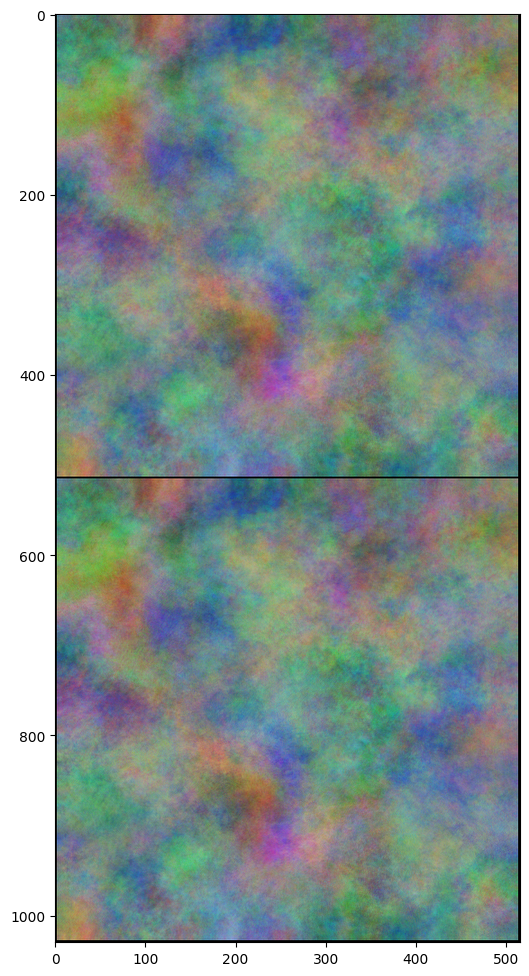

Iteration 0 PSNR history: [7.378852679478127]
Iteration 0 MSE history: [0.18285831809043884]
Average PSNR over last 100 iterations: 0.07
Average MSE over last 100 iterations: 0.0018


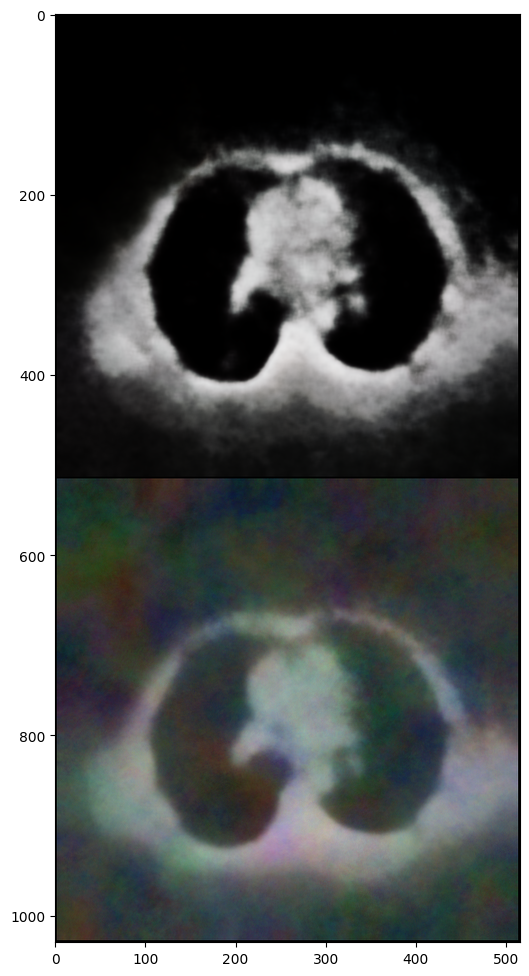

Iteration 100 PSNR history: [7.4023796968042905, 9.049506141973277, 10.348147162611356, 10.715100576220703, 11.814116753835044, 11.830397088073898, 12.079700373288357, 12.307602828285146, 12.020087125206288, 12.301597639080697, 12.433541150939613, 12.541615668955558, 12.936753199063338, 12.267647794479167, 13.385665087715795, 12.801048562798558, 13.61496445815644, 13.976375625025803, 13.593263708752886, 14.101887346392793, 14.315812791698066, 14.41482792158956, 14.413295660363335, 14.53615101850474, 14.66040561078643, 14.809760504511427, 14.956990442384917, 14.962059585894742, 14.9803163492966, 15.066226024546054, 15.364260855418717, 15.460194292444951, 15.479536373810689, 15.420891884273386, 15.810631980939087, 15.911466691142495, 15.911006424608631, 15.529331334051244, 15.466948313642694, 15.625797466445327, 15.151492814329039, 15.92764243265937, 15.992386251123245, 15.802470846545628, 16.1178032061743, 16.127480531550095, 15.624124761360585, 16.47108308600683, 16.44063222750794, 16.

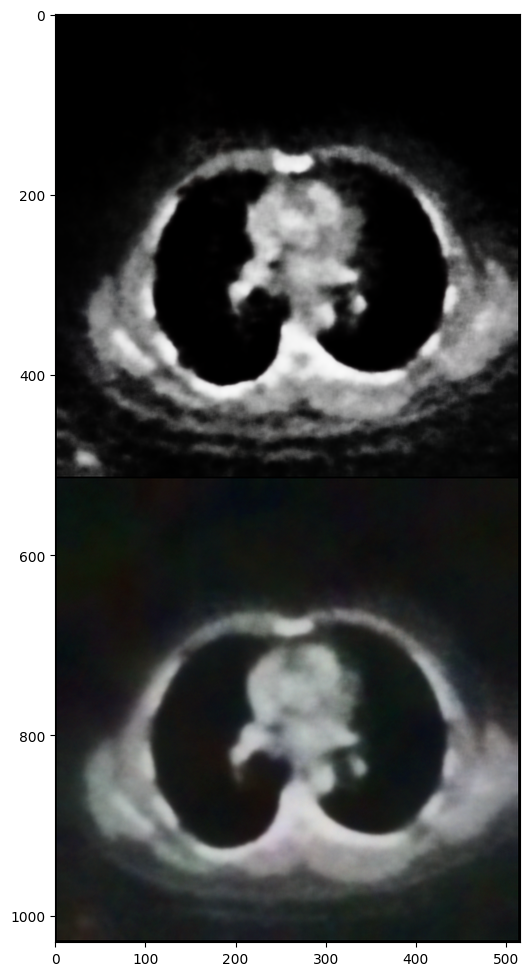

Iteration 200 PSNR history: [18.07073757861506, 17.78750037032815, 18.330259697502882, 18.000442808029593, 17.92303465813173, 18.107986539625564, 18.309848928296088, 18.14114990973379, 18.11765177531199, 18.373338580660704, 18.354493496561137, 18.146574326192656, 18.456600474371722, 18.3813418105912, 18.122626230537165, 18.53973750358684, 18.427472918387448, 18.5798764556715, 18.376563618904722, 18.24743578010811, 18.687640546899043, 18.567644429103105, 18.50519080937713, 18.499828312369683, 18.584627003975967, 18.62329000782383, 18.594396676291527, 18.59804102409964, 18.64039118444349, 18.516130483290894, 18.786987653006836, 18.590316347586228, 18.86882669254539, 18.716668108746674, 18.73971252847207, 18.693898120786265, 18.745884526144508, 18.885650628144663, 18.804536021636135, 18.778776780168094, 18.88620718937716, 18.910800838346947, 18.89761510220858, 18.752176294582952, 18.882466983002224, 18.808349961788178, 18.888472492726198, 18.79872247267041, 18.89949563388829, 18.991263234

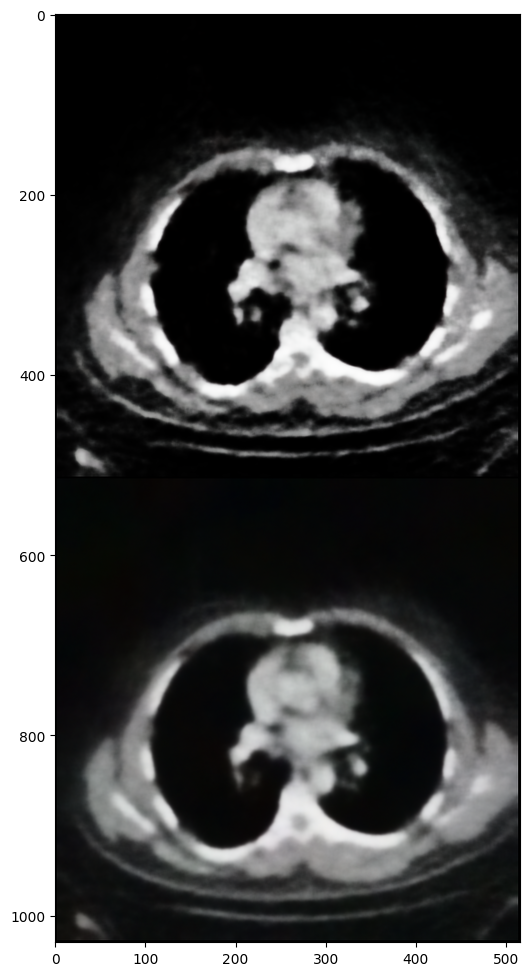

Iteration 300 PSNR history: [19.780319891336163, 19.726036678786297, 19.783105342593057, 19.798393192226207, 19.62855702854316, 19.807350580259456, 19.729922168617435, 19.57656152860912, 19.546794696969577, 19.830422606979052, 19.82298280875179, 19.796713597322594, 20.03204533999842, 20.007509072479106, 19.71461377868874, 19.979620036986066, 19.9341321672966, 19.944139749394765, 19.837734010820707, 19.850051527251164, 20.010211044845157, 20.057000892356044, 19.983698372232222, 19.93286113728852, 20.25184559082976, 19.94914371641457, 20.125062506222168, 20.249725363340985, 20.19246297833594, 20.318383745261514, 20.198230607808885, 20.25038683546485, 20.170611890537685, 20.274013887393213, 20.42914706951227, 20.23587314519682, 20.267010088592365, 20.396733425739658, 20.373322805452723, 20.316817644700087, 20.434326886147723, 20.36544920600567, 20.58342605624757, 20.301631245702893, 20.448253302858408, 20.522062463622113, 20.543912057687294, 20.28379824279717, 20.53814048211377, 20.525078

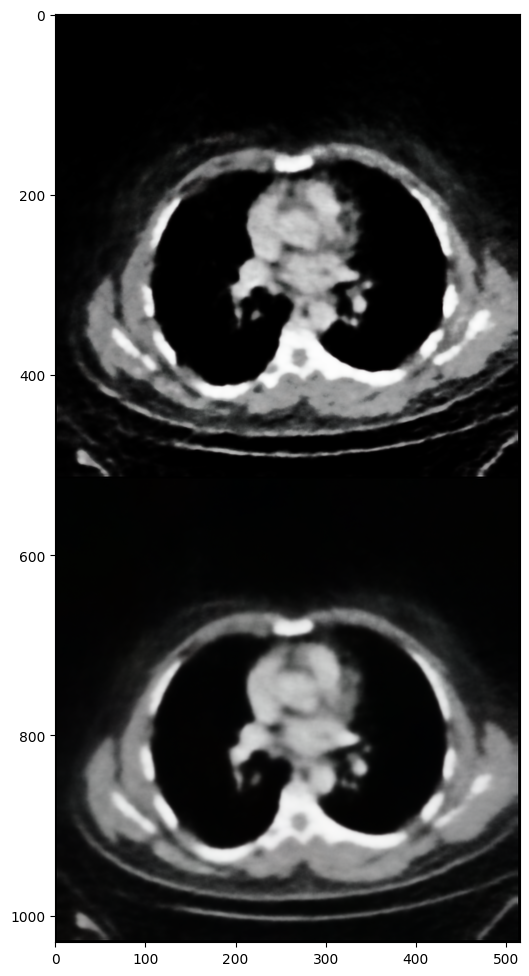

Iteration 400 PSNR history: [21.142624472674456, 20.916486170947767, 21.131404854412654, 20.819569610529662, 20.920354972080794, 20.982868009584617, 21.155276881128295, 20.78368305663574, 21.075222408026065, 20.87352923794342, 21.476796436003397, 21.03603182276599, 21.314878737690414, 21.194628515356314, 21.419564889687912, 21.366592267277106, 21.30989890021281, 21.294800622778922, 21.33957675340429, 21.371171422036753, 21.48598608096234, 21.565506982116336, 21.38514897631877, 21.37578318140826, 21.370775925135277, 21.36787570243664, 21.587325919194356, 21.43901481647309, 21.685508232848107, 21.419359749300423, 21.47191403059635, 21.644708462943733, 21.253104558484214, 21.632871545607767, 21.418620923478496, 21.357786097305503, 21.274230940794062, 21.69092630986061, 21.352815330557608, 21.53672584626911, 21.687917310052928, 21.340851103208536, 21.72929770624699, 21.687590224698333, 21.757149029198644, 21.42689244734924, 21.810407825206603, 21.38710585623166, 21.66161394899683, 21.60577

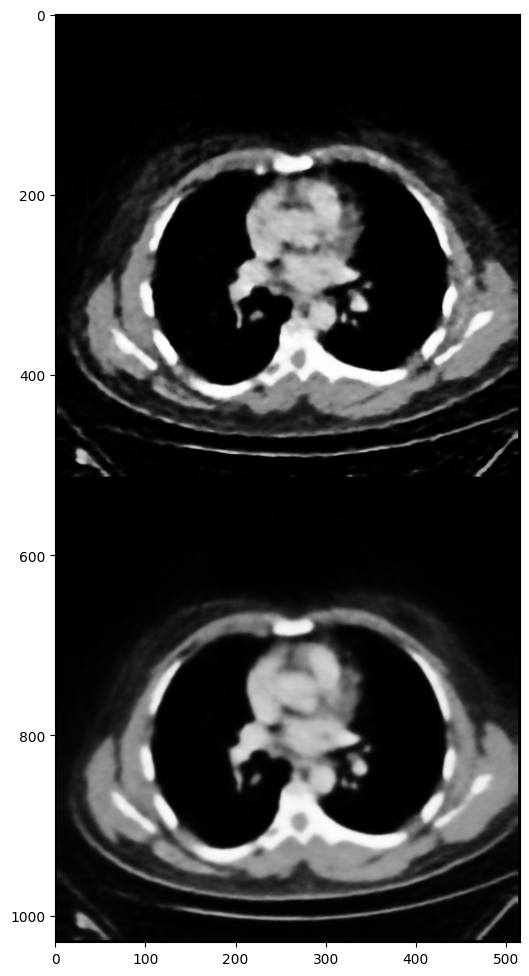

Iteration 500 PSNR history: [22.524374209444083, 22.037144667467526, 22.275331998915043, 22.376981507342393, 22.394477692464122, 22.338463836849623, 22.36854971831111, 22.558605801110808, 22.52520037507751, 22.39181674980901, 22.599696306241164, 22.130254965581734, 22.456203442495898, 22.449118633005543, 22.51360301271535, 22.577900196352875, 22.536555025848934, 22.505306506345452, 22.7227851737768, 22.592803836303826, 22.76889196033469, 22.65908122140292, 22.589354326327715, 22.597170607077878, 22.73098765312543, 22.630505764459485, 22.748773120649503, 22.701888525447615, 22.800390229040723, 22.653954414365842, 22.702322959148447, 22.799159702358658, 22.846131389896076, 22.799807629990546, 22.690005072719963, 22.755748049468195, 22.560511282380116, 22.53379846247203, 22.91420344724369, 22.709365335321312, 22.869115625811276, 22.76011659313891, 23.081293096715566, 22.534202259838235, 22.728956355743666, 22.561558126431166, 22.83769466369399, 22.807085905336734, 22.7069846813677, 22.716

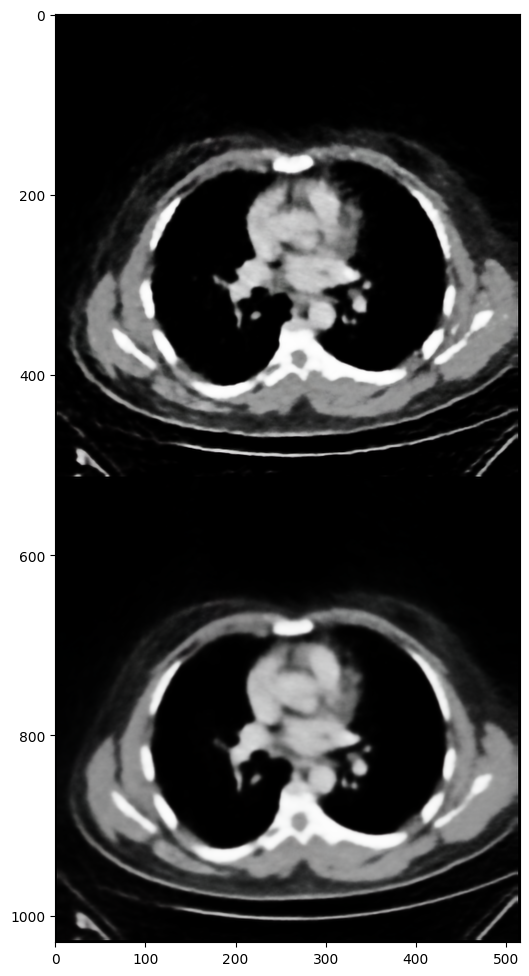

Iteration 600 PSNR history: [23.282678262417143, 23.09638052695697, 23.096428569945036, 23.32681845762216, 23.101122057373246, 23.381580843887573, 23.16030522405404, 23.292796355385335, 23.263077022693174, 23.4412552643052, 23.31552832824346, 23.250984969546202, 23.379616763983154, 23.429846236815564, 23.313584738175855, 23.608580087542073, 23.567715547036986, 23.645204385679, 23.444960279413372, 23.465845190056378, 23.48753421492191, 23.308032348114732, 23.41550588368861, 23.419823613251822, 23.538260616146538, 23.56464474952789, 23.537273750789474, 23.60161213048622, 23.55850306823529, 23.601571066240183, 23.421461436364226, 23.492410258194507, 23.4628578744856, 23.683758786567203, 23.250187297978563, 23.698473502380985, 23.361482805553116, 23.575563548764364, 23.650418451960647, 23.589909360908237, 23.482957731684717, 23.32441586579412, 23.545590415926792, 23.556390384050196, 23.3342341560869, 23.483106720300036, 23.341456386992046, 23.46921211522475, 23.64632206741711, 23.549833965

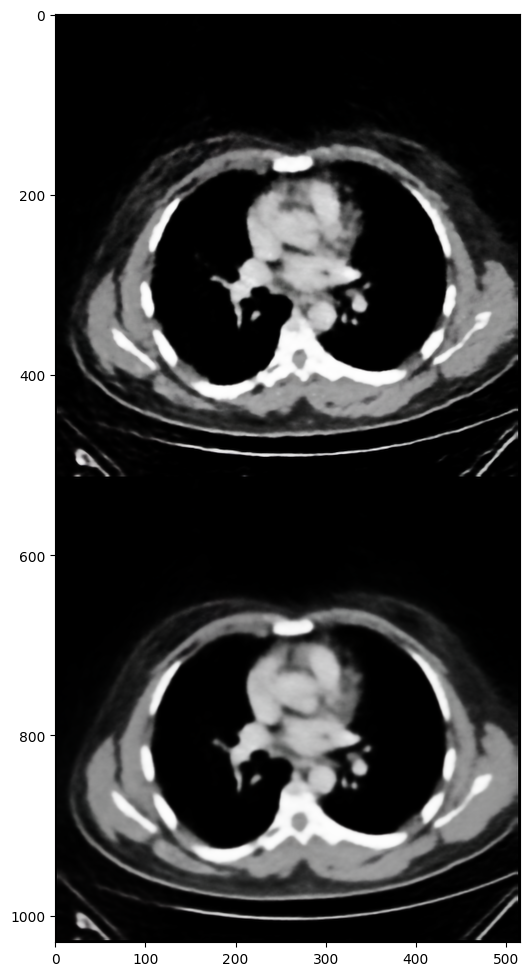

Iteration 700 PSNR history: [24.098087632212575, 24.109352113625842, 24.08917037698817, 24.04594672721883, 24.323930706710776, 24.088340391069664, 24.262713864033877, 24.159095915829877, 24.15042507101387, 24.250665854454855, 23.88744007433302, 24.212794351041854, 23.902078000734214, 24.134950614435983, 24.026090837595802, 24.107023076538475, 24.03317311363159, 24.145364008726325, 23.96115676363444, 24.333778636819176, 23.917956834635156, 24.142403341533104, 24.177818399426812, 24.238202839754997, 24.360245498924602, 24.392993085450637, 24.159923693425817, 24.242188206045498, 24.197126413187743, 24.412060603278313, 24.06898348061327, 24.39627499627057, 24.281581468648326, 24.15166438670658, 24.176042148073492, 24.382953338058645, 24.35270481800847, 24.356583970995516, 24.29614768347063, 24.430662801208864, 24.554882939278016, 24.436381279426644, 24.45545163560816, 24.46156199802803, 24.370363382520072, 24.215710156341146, 24.43605148349384, 24.51413891552776, 24.39756237404563, 24.5422

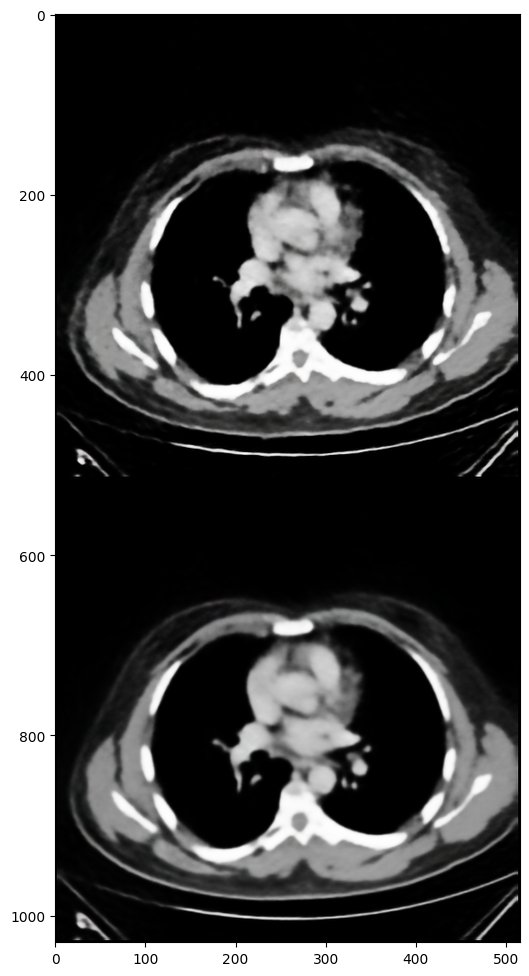

Iteration 800 PSNR history: [24.693047807607297, 24.784365813415032, 24.685905099507117, 24.706886692810883, 24.741196110240725, 24.830956163540485, 24.71971138556228, 24.826320115201867, 24.53759395239431, 24.731884114747817, 24.76396399270893, 24.62174760231761, 24.767857173623412, 24.97261114392522, 24.68653063015866, 24.823412740344892, 24.785028894407155, 24.9331109612596, 24.886019702218828, 25.011163545934355, 24.66015175864523, 24.852714967066763, 24.783641707601767, 24.888216079518163, 24.716989146047375, 24.93150681085309, 24.875080570962833, 24.972743334822635, 25.111773954242015, 25.088066583416975, 24.875851048876534, 24.726012367742833, 24.931571408989885, 24.949429259038155, 25.003678793821912, 24.840510392937603, 25.02428013088423, 24.857491460717483, 24.95586300308093, 24.831987215306143, 25.19582920495595, 24.78140383095547, 24.929174165597274, 24.939556126671064, 25.248252729710924, 24.979882770771674, 24.871762079509306, 24.807382532019968, 25.002240112357434, 25.05

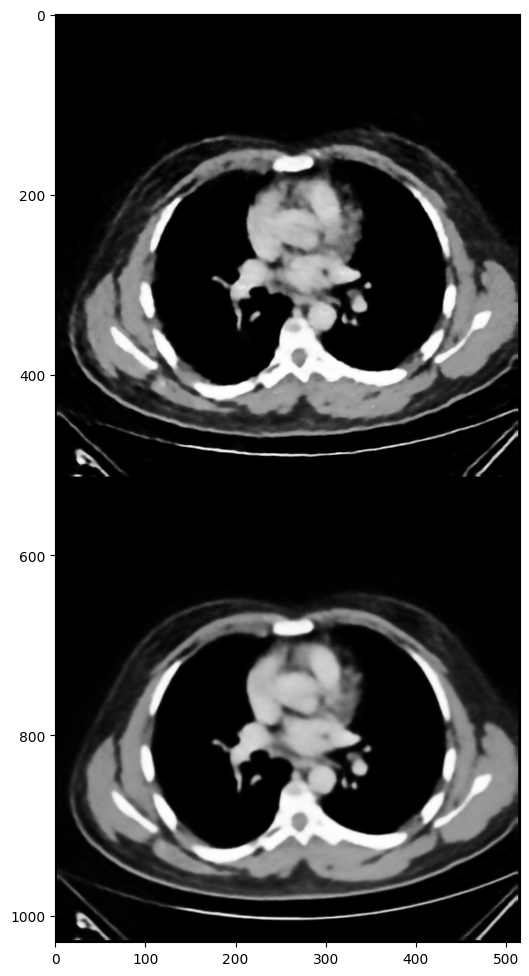

Iteration 900 PSNR history: [25.21240165065258, 25.164418671107484, 25.208517742094894, 25.388570476401146, 25.063293877140644, 25.163136412258424, 25.42590488155042, 25.293829479511775, 25.324581409840636, 25.29282064436193, 25.401988729191704, 25.19499384541424, 25.313284786614542, 25.23683250245043, 25.377839358195597, 25.432537853847712, 25.42839840573898, 25.439795148211317, 25.182840136111174, 25.26187475168247, 25.348484479423412, 25.330226488853363, 25.239689172845527, 25.308514180988745, 25.3118776022011, 25.42973546298514, 25.3770780554108, 25.307343958908657, 25.47418118692383, 25.4077246742496, 25.393105944085388, 25.39515223981632, 25.261000244958755, 25.449034378762217, 25.37768790643159, 25.47568950527912, 25.396353229289996, 25.41342215779128, 25.351971603749128, 25.45412079494571, 25.316308916782514, 25.383692452920922, 25.49613074370861, 25.26227710715939, 25.456420224156908, 25.590282997457294, 25.610777520376903, 25.118743118145446, 25.53780913282462, 25.54701486863

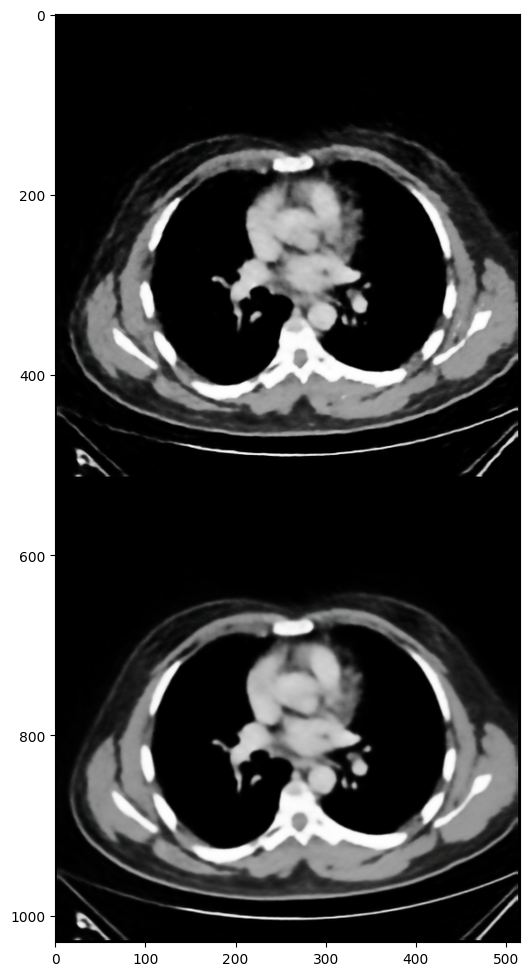

Iteration 1000 PSNR history: [25.859456563523636, 25.935856344601852, 25.840901425044894, 25.63707181501278, 25.69511444610857, 25.796426880971186, 25.83489530580847, 25.78302730080783, 25.882737046147195, 25.76282308925768, 25.73380144776088, 25.68265758362105, 25.68511297162263, 25.705759188319842, 25.67930525374779, 25.743618913945316, 25.89516008332858, 25.643393219435016, 25.751982482235892, 25.692990457093558, 25.83701237463288, 25.7735972600751, 25.94325942165537, 25.803960918616436, 25.77070689522763, 25.82074549938888, 25.948432076431153, 25.93852324763782, 25.797593901053467, 25.764738100250906, 25.81621535721625, 25.93439752725385, 25.881790505069237, 25.809505006417123, 25.74021286414124, 25.71037540193894, 25.800207755462637, 25.779345594765996, 25.799352337772604, 25.84935991759611, 26.126730025181807, 25.999369152846114, 26.06027184893314, 25.787509906066234, 25.99535432499312, 25.805741370588265, 25.77726027683991, 25.610642138830176, 25.944151415158757, 25.725681501161

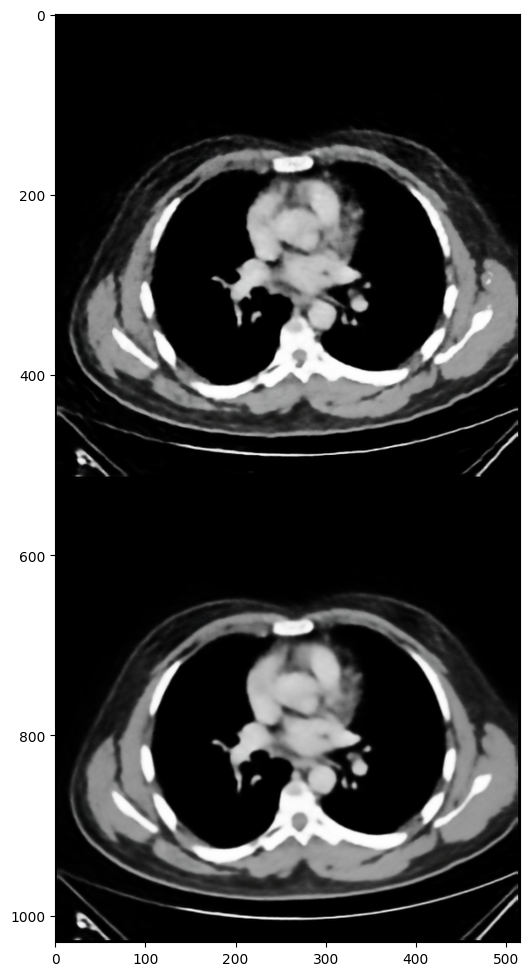

Iteration 1100 PSNR history: [26.0853212925366, 26.00568118423588, 25.992912596780524, 26.184748421915813, 26.095002455633786, 26.114692448822055, 26.27452860421893, 26.189243451660815, 25.779175413777953, 26.294909359631777, 26.21259926969182, 26.322190137942613, 26.288986526467074, 26.10118052965321, 26.254752677138566, 26.259327147585665, 26.295578028374045, 26.390743343424404, 26.345265323404952, 26.254389966434243, 26.344474974426912, 26.20995219312932, 26.295327760276116, 26.21139751252892, 26.21149678302194, 26.21013447197906, 26.16513982003573, 26.08739509466783, 26.12122634929205, 26.398742707363915, 26.18666059404958, 26.223882942278646, 26.187254402797496, 26.191505357198896, 26.062268109507794, 26.27168245904642, 26.209413635974173, 26.049150164709207, 26.17605939511862, 26.150996419749532, 26.21917839978671, 25.957804327464803, 26.24882873148906, 26.155750275341155, 26.17679111728318, 26.120787306274234, 26.361990165419414, 26.253310099966214, 26.30565822591386, 26.1807725

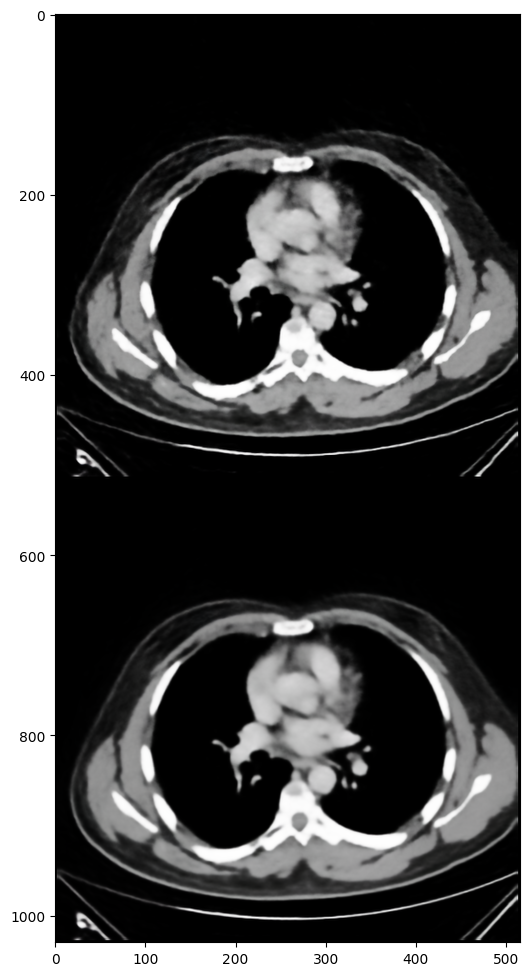

Iteration 1200 PSNR history: [26.452123278351337, 26.55922000701124, 26.515085116546263, 26.30908377587783, 26.33923111746585, 26.469444430550034, 26.320839701041592, 26.534456648091545, 26.46864418565076, 26.33321266142299, 26.460286485030878, 26.408645061970375, 26.324027972660996, 26.49955857702126, 26.462146826981904, 26.37235243335889, 26.461709249183293, 26.255735075416627, 26.441174411467408, 26.39940000621526, 26.22713018038511, 26.287200847430427, 26.45418247272709, 26.294267771016845, 26.34743294618658, 26.379545999497758, 26.651589879307316, 26.32479477388717, 26.694902278897455, 26.667616770233767, 26.482466687122134, 26.662509718938942, 26.51150995216276, 26.600535397709237, 26.662691222780914, 26.5082496686704, 26.615692845766425, 26.500139525533882, 26.608916901148724, 26.580030628254523, 26.52233528781261, 26.635363194658236, 26.568158099468228, 26.634470026274514, 26.65942586984249, 26.681966520884238, 26.625132870531356, 26.36960881088409, 26.506068855447765, 26.69210

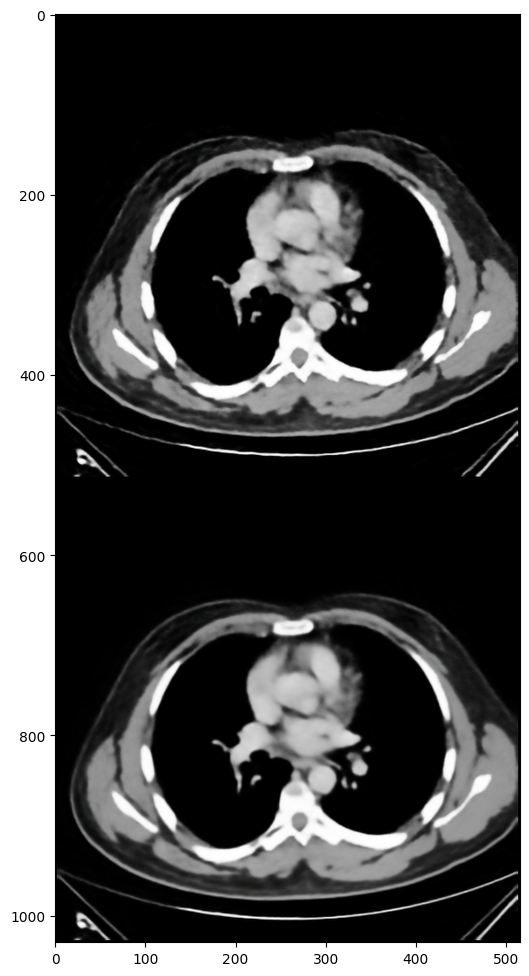

Iteration 1300 PSNR history: [26.657908286394086, 26.69537195777355, 26.745795890791044, 26.874188585933467, 26.719886318073595, 26.807408711823292, 26.867645241670033, 26.864460698715085, 26.544200886632147, 26.858710260662477, 26.66163516394519, 26.603226696161883, 26.950864482316184, 26.788043573140484, 26.85650154985848, 26.72481990020477, 26.715549937316023, 26.88029893851961, 26.957006200940043, 26.729058827034518, 26.932155709644803, 26.94048118459822, 26.80823810889059, 26.978361589611136, 26.781205032149373, 27.08679926646832, 26.714411819365477, 27.011764331403498, 26.574092762994674, 26.941394059461384, 26.622345435316316, 26.830829609471248, 26.680501010041127, 26.604756097416157, 26.91242566130937, 26.685755509458836, 27.118647141936563, 26.824591567495926, 26.964603741438616, 26.787642867937727, 26.982058707990557, 26.935123581084845, 26.92915033999125, 26.70301036719662, 26.903102595390045, 26.770247518878136, 26.96470840969651, 26.85877444027874, 26.871160374089833, 26.

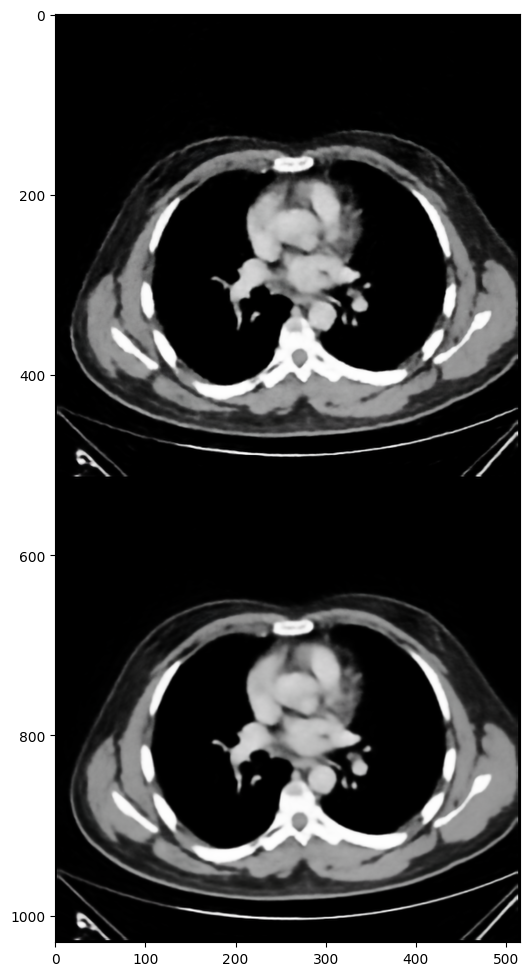

Iteration 1400 PSNR history: [27.04367513799111, 27.267805973601106, 27.015624634730955, 27.00722585391312, 27.11460956244776, 27.38341347066158, 27.09018847339785, 27.209842744986194, 27.221562960670372, 27.26948177671007, 27.124001165687126, 27.30929457632161, 27.22729060580884, 27.12523981787165, 27.009661184149408, 27.181989562727363, 27.110992563141636, 27.10832406510758, 27.06494533315421, 27.251255511254318, 27.109674396761775, 27.234634152196566, 27.104634800241556, 27.282155671058852, 27.34554695506661, 27.176466415201883, 27.217769872318875, 27.28708868869813, 27.31572432838758, 27.218853672826263, 27.258500596235983, 27.134414497076534, 27.2134488715114, 27.25306593642054, 27.17694212522013, 27.15876453792268, 27.097445222541406, 27.140107496081527, 27.037484800898714, 27.106430655670408, 27.053399703190983, 27.17463447878448, 27.244506463854357, 27.28011820510663, 27.28244880797833, 27.117515110549032, 27.239212143213805, 27.02231369670781, 27.343579264497517, 27.2040790078

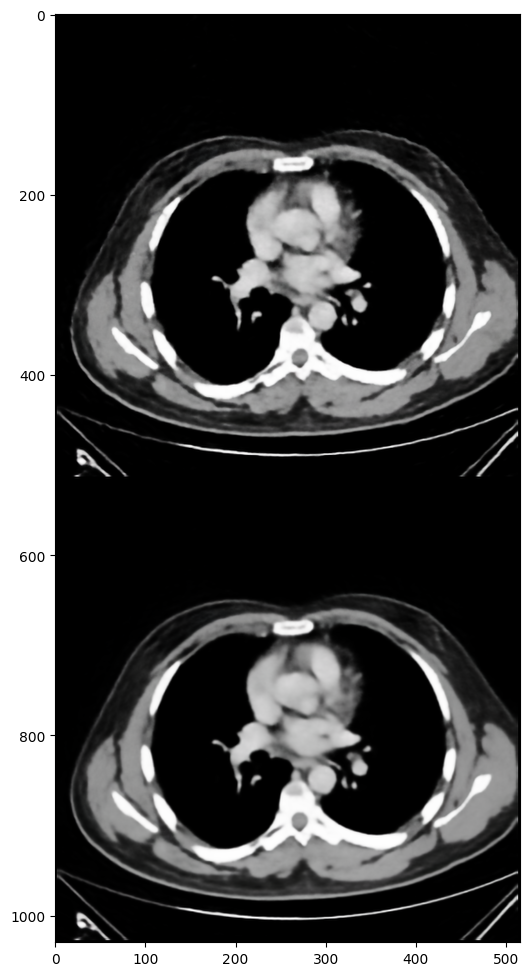

Iteration 1500 PSNR history: [27.23743869996387, 27.464466612504566, 27.36127813763355, 27.299734873094977, 27.199057144691878, 27.571856297052552, 27.186396641894802, 27.518076317486482, 27.36772197631054, 27.438992545017307, 27.401338521574083, 27.338458480004107, 27.530954554275745, 27.356403005242512, 27.406727146550857, 27.338934031987634, 27.44702735405841, 27.38738839772751, 27.4136632758235, 27.35860681301167, 27.38583275812576, 27.27303315788439, 27.249616954020123, 27.470546855632506, 27.187367265481278, 27.61262139398363, 27.267005559345293, 27.39752554978559, 27.314524397913434, 27.40228381799212, 27.531059225399304, 27.23438910037652, 27.592806987557722, 27.410078076188647, 27.23741347120631, 27.57832628854156, 27.624382703426775, 27.371322627413782, 27.416243146945554, 27.493071222012972, 27.43217726212982, 27.34920581247159, 27.329592922124842, 27.428080418031303, 27.323383862769255, 27.29177990141644, 27.488011646470184, 27.102804929685842, 27.40428930485619, 27.2419678

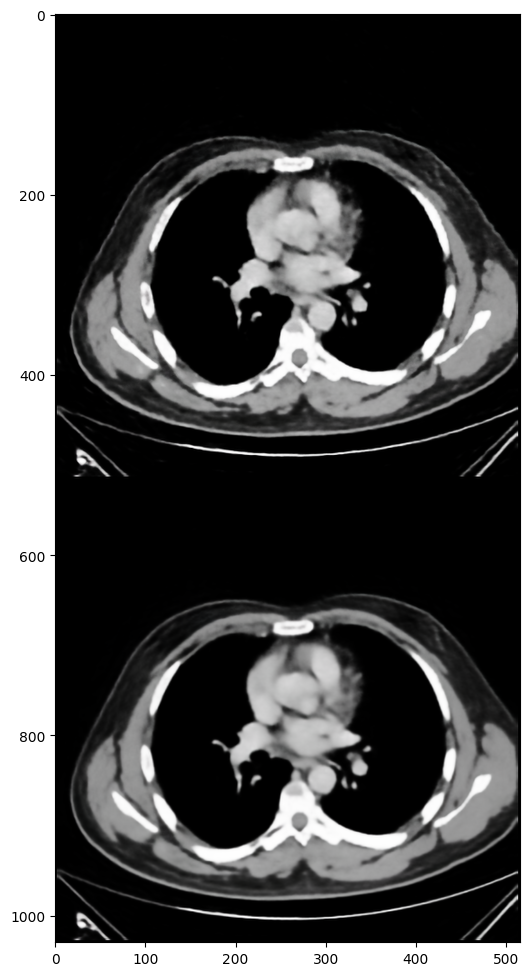

Iteration 1600 PSNR history: [27.610459095238497, 27.624667046234244, 27.507881528633913, 27.488257446693538, 27.288272144077283, 27.64454518160796, 27.521857749368955, 27.613001824340113, 27.662099110580076, 27.45858887783772, 27.450491668197586, 27.729558259979527, 27.454067469153188, 27.53457023919004, 27.441099177790186, 27.647798821726255, 27.377908907536114, 27.644372452380406, 27.52832222071796, 27.715381617526557, 27.468812168853376, 27.539625246720163, 27.68490231577886, 27.733773251576572, 27.625202701289982, 27.7895776539127, 27.539869670507432, 27.86666776232559, 27.745772104906642, 27.639354057510907, 27.86803066887494, 27.70958816125447, 27.81174891324077, 27.73117028217353, 27.590798199578963, 27.925750805805798, 27.74686924455724, 27.830658793123444, 27.644529012333592, 27.94349241556416, 27.654668141484713, 27.758463657229733, 27.76947011173614, 27.631059995479703, 27.86319189681343, 27.789746005595823, 27.756566337699475, 27.831276173137528, 27.612515804016166, 27.982

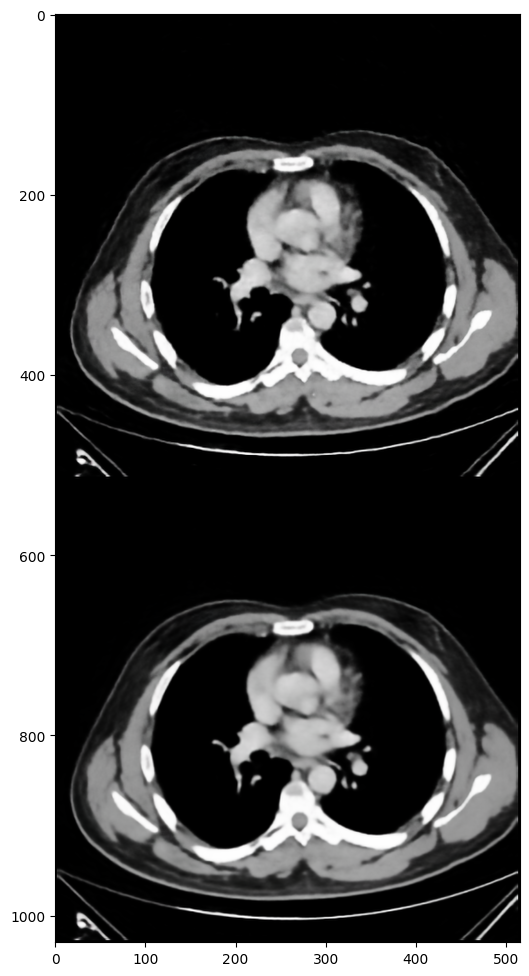

Iteration 1700 PSNR history: [27.976123470765568, 27.75963256269548, 27.89318529597502, 27.855393824699632, 27.950298141966677, 27.729555640801458, 27.9739397567389, 27.868002603747062, 27.912546473611375, 27.85161341317255, 27.986225375959624, 27.69965220936927, 27.93355643114014, 27.7361509851114, 27.661069086697236, 28.001008386177073, 27.865269404583977, 27.8895743140271, 27.823524259791164, 28.041992637791793, 27.86852644022546, 28.050472886586473, 27.980251205732856, 28.13779541380089, 27.816164821688332, 28.201929435124274, 28.026569218810835, 28.01392253978761, 28.100483492443857, 28.000421724575165, 27.903411025848296, 27.915667093172495, 27.838375390367574, 27.77935711908638, 27.915904150411848, 27.925490721778647, 27.988310125216508, 27.925006287553444, 27.9486802287062, 27.99368079753379, 28.1154112802652, 27.88462316348427, 28.070709855856315, 27.91933923672805, 27.948897876935256, 27.977360988712725, 28.006447555806787, 28.07910601340827, 27.899974802439566, 28.0884661490

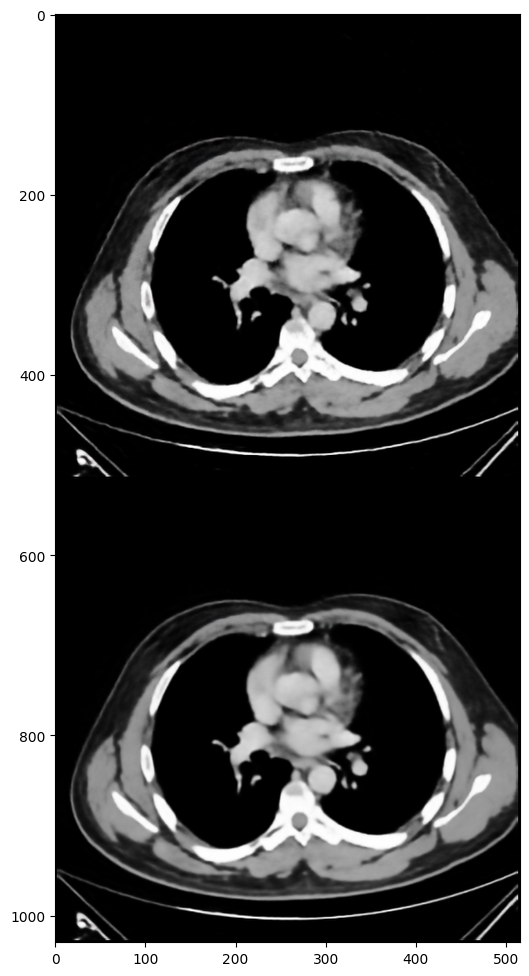

Iteration 1800 PSNR history: [28.227348415127267, 28.19698804883108, 28.07717977435203, 28.283589088466883, 28.133528944975605, 28.110749449641126, 28.273091796594805, 28.04827961333453, 28.163994551536163, 28.10910527386526, 28.227220126115675, 28.07321921647304, 28.131511981972555, 28.080343114201526, 28.218514093242316, 28.198942928681774, 28.216634568816332, 28.189219586882427, 28.212522512535834, 28.263671048310755, 28.03520506481112, 28.27890785786068, 28.265549484110302, 28.411152387251256, 28.189435725721044, 28.31694336097349, 28.10955762849369, 28.238564723703085, 28.17420269315644, 28.129442212381974, 28.295043384023856, 28.224498156711707, 28.11861529053802, 28.310742676889042, 28.147058406572288, 28.216289662222614, 28.247788124810068, 27.94636865655905, 28.23173650746222, 28.11594038147288, 28.135505094497013, 28.158141890256037, 28.093414276649945, 28.086043060980543, 28.235870656340786, 28.21171457757057, 28.310377215906264, 28.19116648161309, 28.342798217674734, 28.295

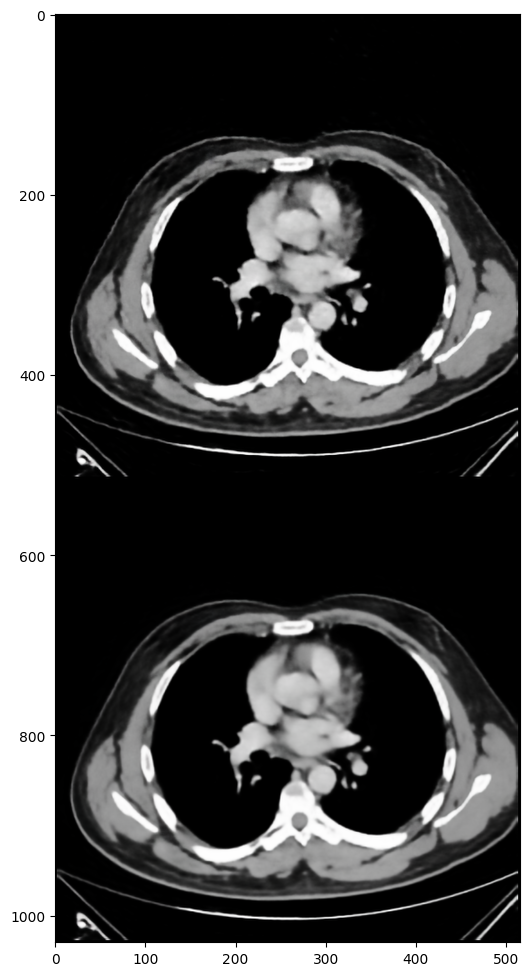

Iteration 1900 PSNR history: [28.1702015001964, 28.175217563721407, 28.25599556800602, 28.030494211230955, 28.341616290627506, 28.26886909750755, 28.263316768160365, 28.287301387012967, 28.345427939485038, 28.327402438163514, 28.335791698792047, 28.275650449862148, 28.19693896329836, 28.380863527664623, 28.094010224243814, 28.524890664473066, 28.458410328525016, 28.541488210301587, 28.567140760859285, 28.38328557969277, 28.453906664510065, 28.409535549322115, 28.52077772371656, 28.3743122589873, 28.476688619930314, 28.575409330580356, 28.377840970895466, 28.537954969927153, 28.465933107225204, 28.43411071012946, 28.55129706595392, 28.459877091593953, 28.189839299654448, 28.399713873763584, 28.56721594201419, 28.40781068338555, 28.534620880297652, 28.430710611150083, 28.290881279713584, 28.27529707143767, 28.464580684619534, 28.292332940377342, 28.302782422414744, 28.30182986964028, 28.370984427929663, 28.562100622416327, 28.310102859999784, 28.41244261495359, 28.486047735662275, 28.617

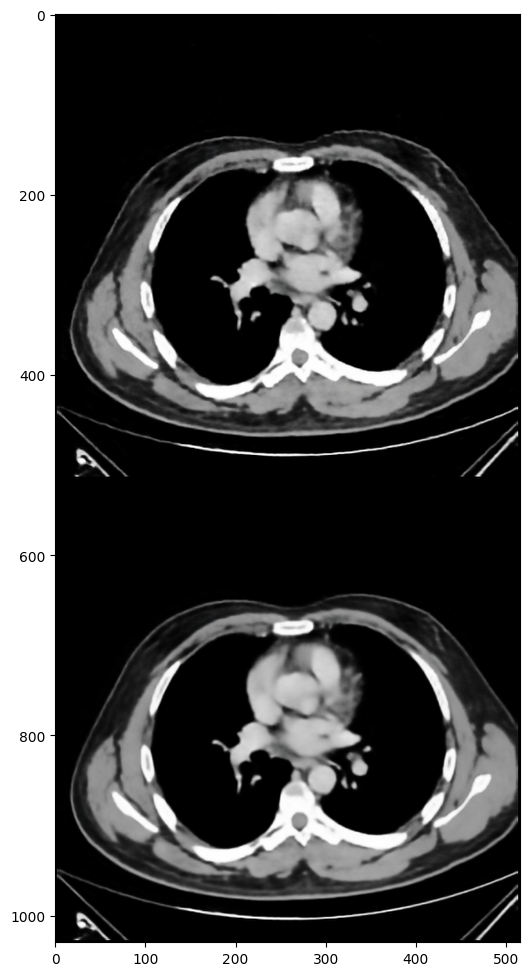

Iteration 2000 PSNR history: [28.460804652013657, 28.447354897967195, 28.71508039877188, 28.595404857191276, 28.79190675049759, 28.66610288646715, 28.61438034312489, 28.69572345199922, 28.74508343785848, 28.67320133386908, 28.597306483857512, 28.68593533762706, 28.67243074574558, 28.53845579393942, 28.69195229216156, 28.462306790897493, 28.537680009579155, 28.715888732759485, 28.633295204260175, 28.60366483648231, 28.652705734007633, 28.70853654962666, 28.631836084326014, 28.548532969612626, 28.484021490121684, 28.580725766327568, 28.66112730735621, 28.5638177211975, 28.27290601586779, 28.701971533621467, 28.50770694816536, 28.56627076866574, 28.58780276766054, 28.53965599408864, 28.52047552548243, 28.678162979487652, 28.60105510150692, 28.552634170227588, 28.76246632784667, 28.58379431532444, 28.539869313608154, 28.779431028498475, 28.521746111365655, 28.397370459490507, 28.89559951268484, 28.329185429844127, 28.646148538001633, 28.32230131889108, 28.700514538307104, 28.34354085163180

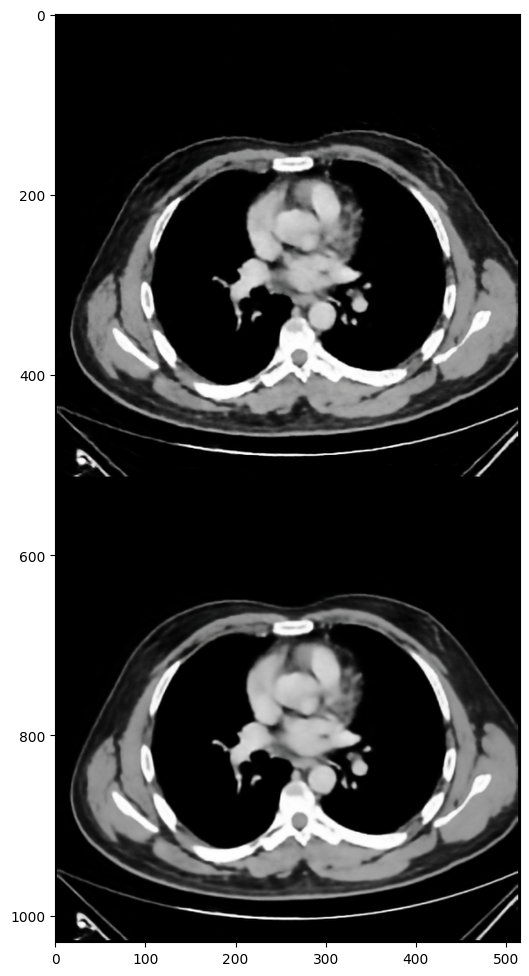

Iteration 2100 PSNR history: [28.675165169992706, 28.797598777240488, 28.727932376902842, 28.735827817623537, 28.678909786723942, 28.825015479043095, 28.749581546952054, 28.811909574138525, 28.901509098176117, 28.85429340190936, 28.725128904423652, 28.80993696733448, 28.788127197695204, 28.89404376140709, 28.876130284862004, 28.85311208841862, 28.99803453960196, 28.826042818042406, 28.994495584426158, 28.869625323176102, 28.89425308801205, 28.934259428257484, 28.88737707140838, 28.86043032944841, 28.827693705956726, 28.951127007915147, 28.932794602626025, 28.856634396857213, 28.898375955285417, 28.811145792463257, 28.832131510165333, 28.97546831164029, 28.68175277099339, 28.72827023190297, 28.721262060098105, 28.6788235323103, 28.722619164784653, 28.910179746862276, 28.727237369989147, 28.804573745151796, 28.78354801884322, 28.90986712099142, 28.957999392315493, 28.815593814655394, 28.825532487161745, 28.788063616871547, 28.774568786940364, 28.770115707444525, 28.867094402777763, 28.86

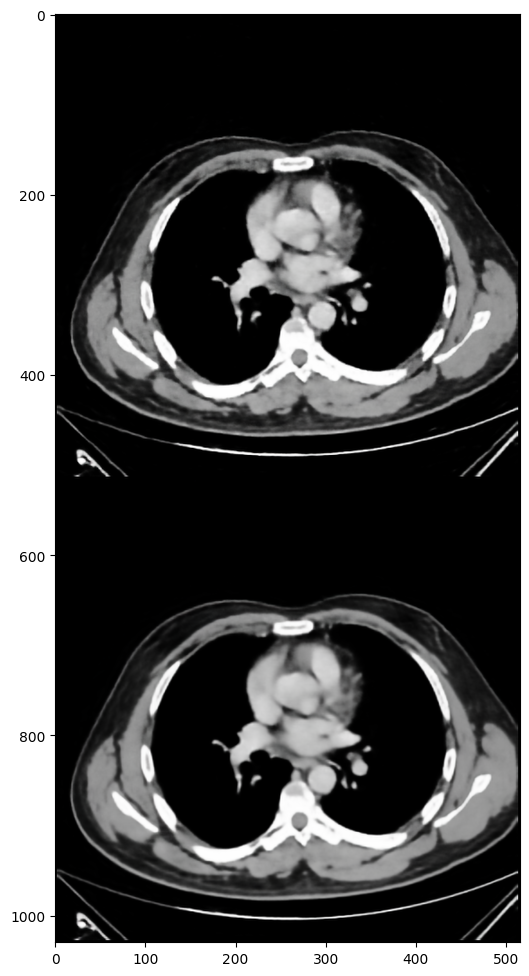

Iteration 2200 PSNR history: [28.799222956622256, 28.867650770265442, 29.177731321141206, 28.722114207188547, 28.91697530382143, 28.926747163704533, 29.161996430375257, 29.00656734313026, 29.03465786221661, 29.093098798883776, 29.034015214754866, 28.966877298492, 29.147776040601585, 29.193789357271783, 29.071063044358453, 29.103969873964715, 29.023557793444912, 29.013143670996413, 29.20910721097662, 29.069814316928777, 29.12286224734337, 29.04245830609065, 29.066714635323056, 29.077501661523804, 29.108939914110913, 29.107354064576853, 29.279630326021536, 29.154263430776176, 29.117648897273675, 29.10066344020006, 29.109729379443394, 29.001125044889612, 28.974788416644273, 29.18329415655449, 29.220186472542995, 28.942632943762447, 29.20028286046279, 29.03338217548116, 29.080472233144718, 29.137290776259604, 29.11549502669216, 28.82529206530217, 29.06933023666578, 29.040409958219495, 29.218224576091938, 28.975339098279957, 29.09431034772203, 29.173119516763887, 28.97053781169445, 29.05588

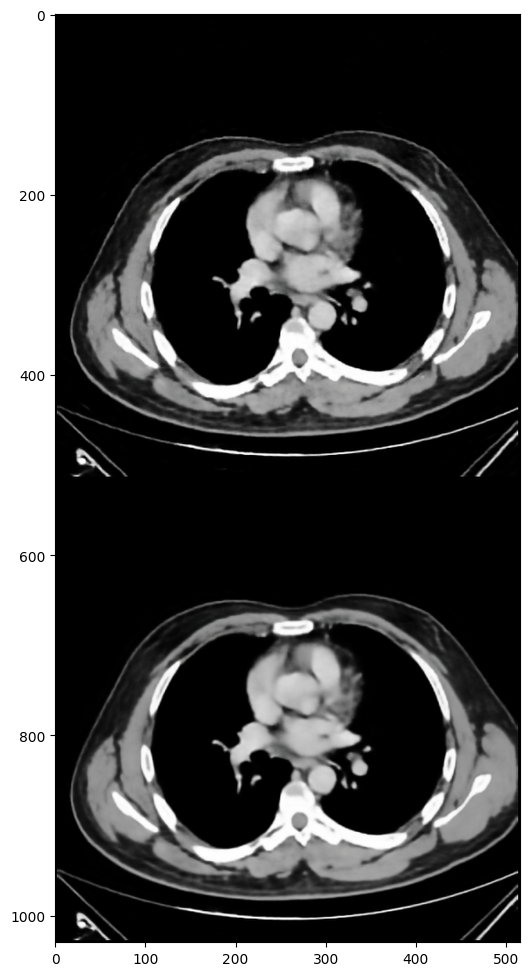

Iteration 2300 PSNR history: [29.154495436417566, 28.98162146318431, 29.31541411898163, 29.164834815127357, 29.242090372775383, 29.28421370589446, 29.091478633026654, 29.26391173761145, 29.184384577687513, 29.18283866277784, 29.34931585002602, 29.36382753823143, 29.469493060592047, 29.324093084310768, 29.247197400991944, 29.208716706481802, 29.293685261069676, 29.33206592993233, 29.440271418474847, 29.339679616517437, 29.238889642609784, 29.32194248028747, 29.222215392560877, 29.06836388362847, 29.114101715621764, 29.217296558817164, 29.18529859667819, 28.873600396481915, 29.176906500998015, 29.256057597401238, 29.32284068850022, 29.09487289849598, 28.96429840383217, 29.20273911855042, 29.16048739403299, 29.289057561272323, 29.09633809111147, 29.22219298395486, 29.2879065975483, 29.232528122497285, 29.112055042083142, 29.255489321312126, 29.269486557478853, 29.031473993214647, 29.21630291419129, 29.32643307913633, 29.17290558876666, 29.310772996200324, 29.125808498479092, 29.2553354491

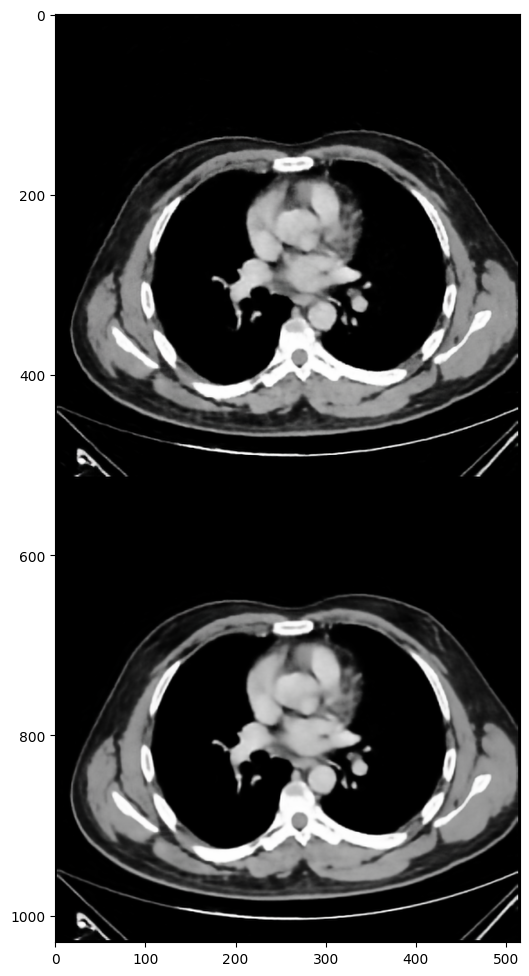

Iteration 2400 PSNR history: [29.377037246313783, 29.465164350161622, 29.373329516169736, 29.4508415184562, 29.41440957225101, 29.424270279768983, 29.279336552143125, 29.44578841559045, 29.45025317694581, 29.35781037829556, 29.361477636646732, 29.27035047341444, 29.34812765289497, 29.222076704048476, 29.408938855249687, 29.216845911717385, 29.3827969952584, 29.181616136059137, 29.431686805434513, 29.343086699998757, 29.387098559839295, 29.312883862850295, 29.36841033561532, 29.21925745898023, 29.453272386549987, 29.37455117343914, 29.35807546137498, 29.18959809570896, 29.148750071490355, 29.413651656719736, 29.233738972811185, 29.38488649194053, 29.421855394610642, 29.28890612142727, 29.421692833263464, 29.419424705406563, 29.32472827357291, 29.490680280037953, 29.46205721197119, 29.19704520694163, 29.507023832733616, 29.3152036350022, 29.429163334345972, 29.188315154874374, 29.365920318510778, 29.41796118998004, 29.143019933215125, 29.239404287320685, 29.274909401502743, 29.4280059506

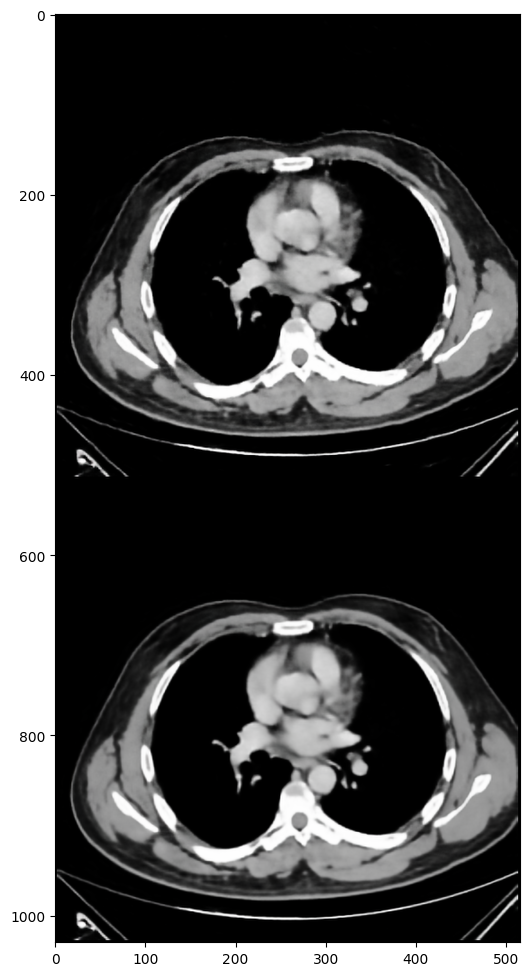

Iteration 2500 PSNR history: [29.6688716109667, 29.610310470065105, 29.546591744482583, 29.653290450114817, 29.754698411444352, 29.67278819655815, 29.635491118709112, 29.573005492760963, 29.490332849219463, 29.248460893220447, 29.44678402110549, 29.642184381583778, 29.611180458789047, 29.531300875283264, 29.606091630144395, 29.723874503471734, 29.501555798525413, 29.72358935367165, 29.636788761283924, 29.621814887198976, 29.7228498827503, 29.50398503051018, 29.64507122933248, 29.480096694814463, 29.598355513210226, 29.729003864510105, 29.716293153990023, 29.601041400166473, 29.771124335559698, 29.6481833797006, 29.50933230618827, 29.71327166855067, 29.65947228503321, 29.617281911603527, 29.430544560811505, 29.51827315166569, 29.324739419880224, 29.52389776093043, 29.575119041372787, 29.348588144667545, 29.404664773005223, 29.695709786969942, 29.70004171499469, 29.513546301869532, 29.39615703798687, 29.72692420765743, 29.522876349329287, 29.51664972486826, 29.372383423351593, 29.5563013

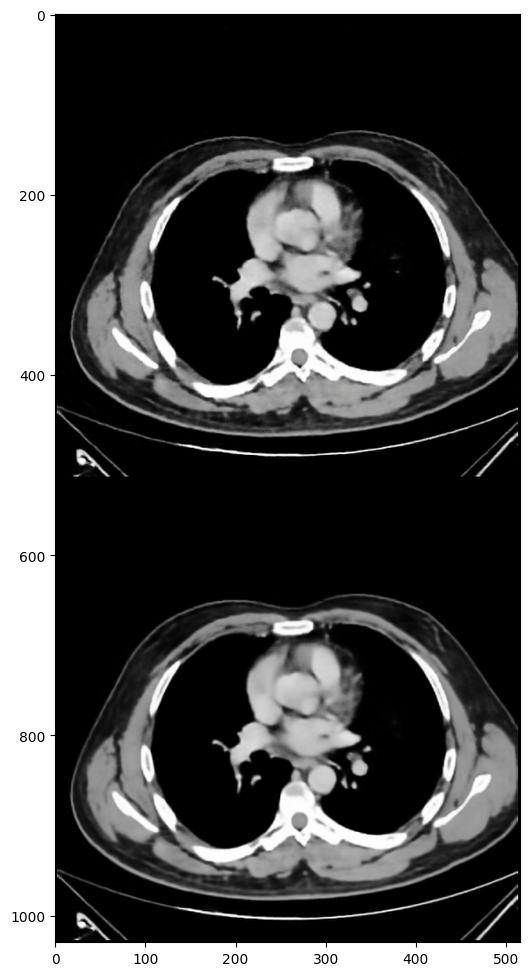

Iteration 2600 PSNR history: [29.602022861976135, 29.740662235812422, 29.70447040083624, 29.643496719972298, 29.547605951784575, 29.686389759630668, 29.650901858298383, 29.756001025330537, 29.826154041708726, 29.67212284012645, 29.885038946122336, 29.627389284240717, 29.87155048753055, 29.595260824282967, 29.768337817098754, 29.54739120517563, 29.689599260086453, 29.692547468893512, 29.681983436808792, 29.75423121091047, 29.64639312044949, 29.613835060840522, 29.455147787513813, 29.582896643236786, 29.664218161549016, 29.523584974543308, 29.548669194700015, 29.63788422971478, 29.371703302802665, 29.41017927757564, 29.640920414841755, 29.375467997847906, 29.676329590454223, 29.405120269394736, 29.591021417848143, 29.737654718579627, 29.598554163446636, 29.66294175971644, 29.436159196484034, 29.47803378047006, 29.690310655479063, 29.482712253001818, 29.635459915378355, 29.76715551976462, 29.506363343992522, 29.453338531051113, 29.57369356082172, 29.636923965060987, 29.704277470053057, 29

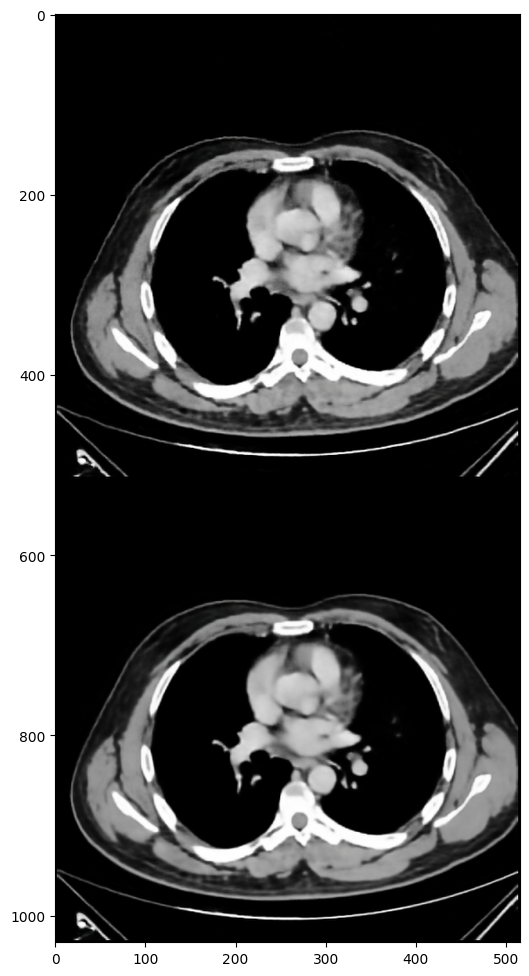

Iteration 2700 PSNR history: [29.89302946785207, 29.874474449950362, 29.94326657222706, 29.89745479867327, 30.03461036904948, 29.961510955652443, 29.891363167399444, 30.05080476017501, 30.029257135510754, 29.841520847303173, 29.989922192910356, 29.80238617740433, 30.06460355977766, 29.957212745770207, 29.898525887292973, 30.111541130699866, 29.904564815435883, 29.72143222299128, 29.793843760766837, 29.90328243733368, 29.919931586190632, 29.883104857450007, 29.822031541088904, 30.02494881112014, 29.791814662272053, 29.717515002909707, 29.999561396354792, 29.966272811366007, 29.760064243543813, 29.871139631402567, 29.724618352084388, 30.019126853446025, 29.58081154668362, 29.796055161320993, 29.856626814252486, 29.650922062412914, 29.735562926493508, 29.95120675652572, 29.80074933616237, 30.0107304122583, 29.698298672924295, 29.848770799754444, 29.872321954159744, 30.136783303153155, 29.86383831342614, 29.93130563342625, 29.944492417914425, 30.102768007027322, 29.85458784110393, 30.01733

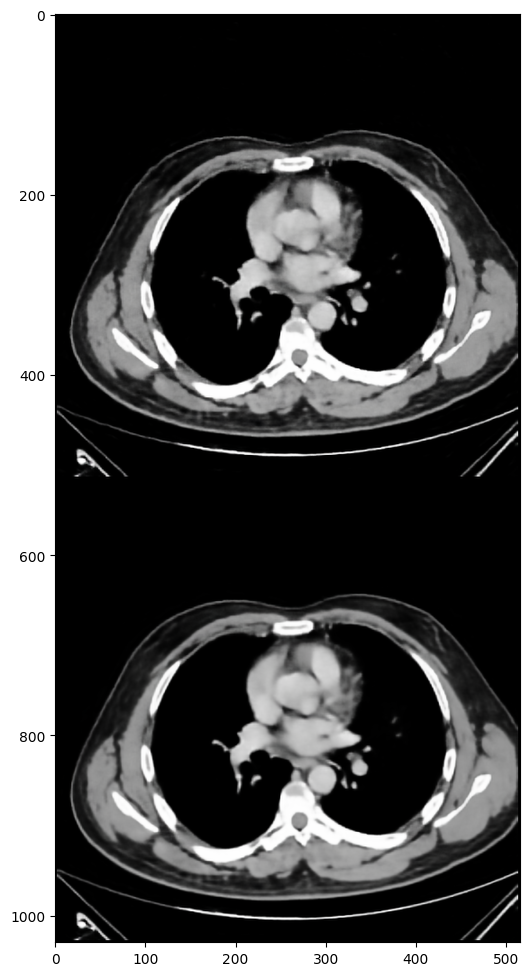

Iteration 2800 PSNR history: [30.124946795814935, 29.99983139079174, 30.147167405902056, 29.98671811177402, 30.083041195182197, 30.150698853058145, 30.156064607814827, 29.968291721766562, 30.13140288185962, 29.88068155974583, 29.955362254912682, 30.03316478981138, 29.962881604272667, 30.135259372542386, 30.174904896956267, 29.969421345163685, 29.99299658596115, 30.10357320655268, 30.20297042418018, 30.138225161272068, 30.186088136418935, 30.13360458166954, 30.161311414725564, 30.09054810955552, 29.944346689442185, 30.123645694409422, 29.828121793914374, 30.07475336710263, 30.16361930689318, 29.932968865947377, 30.10872845047622, 30.08644994502341, 30.063902080845534, 29.866135391156664, 30.188293661377983, 29.894589465403616, 29.86453449974165, 30.154183848459496, 29.93073660617021, 30.257821519196504, 30.193430207492188, 30.182251366311583, 30.23498302394055, 30.11387489529618, 30.263313860442153, 30.22702322611542, 30.219025261248934, 30.20298493337539, 30.039076077598015, 30.1540855

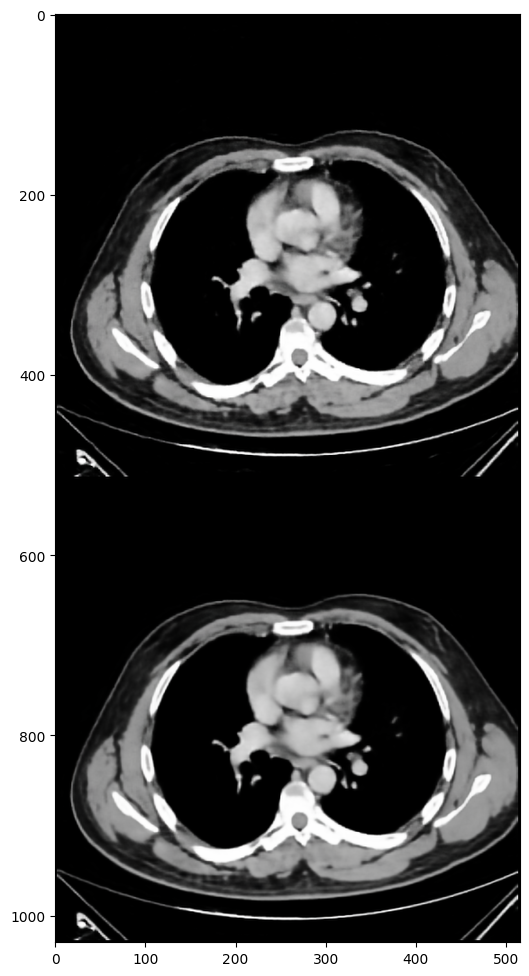

Iteration 2900 PSNR history: [30.354516966608827, 30.3115558025005, 30.175874916253864, 30.271340568925666, 30.062312985838503, 30.314989743028313, 30.061517279248086, 29.898727538190492, 30.229705547291847, 30.039390387993002, 30.209585412878592, 30.265836589416462, 30.101401892353383, 30.236865174382114, 30.12078626923783, 30.22133366634715, 30.36909209343356, 30.15786304725761, 30.394662601085066, 30.22466921920011, 30.139946112882022, 30.120722167407095, 30.06845754725221, 30.492836023950723, 30.17339566851509, 30.2331259365667, 30.141091062394537, 30.31426493578467, 30.27277935273624, 30.241177557975476, 30.310878072941, 30.24199784047481, 30.292578776730643, 30.28320994700728, 30.19271153631874, 30.313939468656738, 30.3115968376326, 30.400146703217036, 30.412499061165587, 30.33464115233003, 30.357557578192118, 30.35582570138978, 30.31320812911881, 30.334419331258378, 30.413120282537783, 30.327673113641573, 30.397232971027243, 30.23064222754716, 30.135703282297165, 30.312496607845

In [ ]:
psrn_noisy_list = []
mse_list=[]
mse_per_batch = []

import pandas as pd

df_psnr_history = pd.DataFrame(columns=['Iteration', 'Loss', 'PSNR_noisy'])

def update_psnr_table(i, loss, psrn_noisy):
    df_new_row = {'Iteration': i, 'Loss': loss, 'PSNR_noisy': psrn_noisy}
    # df_psnr_history = df_psnr_history.append(df_new_row, ignore_index=True)

def update_mse_table(iteration, mse_value):
    mse_list.append(mse_value)

net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()
out_avg = None
last_net = None
psrn_noisy_last = 0



i = 0
def closure():

    global i, out_avg, psrn_noisy_last, last_net, net_input


    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)

    out = net(net_input)

    # Smoothing
    if out_avg is None:
        out_avg = out.detach()
    else:
        out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight)

    total_loss = mse(out, img_noisy_torch)
    total_loss.backward()


    psrn_noisy = compare_psnr(img_noisy_np, out.detach().cpu().numpy()[0])
    psrn_noisy_list.append(psrn_noisy)
    psrn_gt    = compare_psnr(img_np, out.detach().cpu().numpy()[0])
    psrn_gt_sm = compare_psnr(img_np, out_avg.detach().cpu().numpy()[0])

    mse_batch = mse(out, img_noisy_torch).item()
    mse_per_batch.append(mse_batch)

    # Note that we do not have GT for the "snail" example
    # So 'PSRN_gt', 'PSNR_gt_sm' make no sense
    print ('Iteration %05d    Loss %f   PSNR_noisy: %f   PSRN_gt: %f PSNR_gt_sm: %f' % (i, total_loss.item(), psrn_noisy, psrn_gt, psrn_gt_sm), '\r', end='')

    if PLOT and i % show_every == 0:
        out_np = torch_to_np(out)
        plot_image_grid([np.clip(out_np, 0, 1),
                 np.clip(torch_to_np(out_avg), 0, 1)], factor=figsize, nrow=1)
        print(f"Iteration {i} PSNR history: {psrn_noisy_list[-show_every:]}")
        # print(f'\MSE for this iteration: {mse_batch:.4f}', end='')
        print(f"Iteration {i} MSE history: {mse_per_batch[-show_every:]}")

        total_psnr_sum = sum(psrn_noisy_list[-show_every:])
        avg_psnr = total_psnr_sum / show_every if psrn_noisy_list else 0
        print(f"Average PSNR over last {show_every} iterations: {avg_psnr:.2f}")

        total_mse_sum = sum(mse_per_batch[-show_every:])
        avg_mse = total_mse_sum / show_every if mse_per_batch else 0
        print(f'Average MSE over last {show_every} iterations: {avg_mse:.4f}')

        update_psnr_table(i, total_loss.item(), avg_psnr)
        update_mse_table(i, mse_batch)

    if  PLOT and i % show_every == 0:
        out_np = torch_to_np(out)
        #plot_image_grid([np.clip(out_np, 0, 1),
                         #np.clip(torch_to_np(out_avg), 0, 1)], factor=figsize, nrow=1)


    # Backtracking
    if i % show_every:
        if psrn_noisy - psrn_noisy_last < -5:
            print('Falling back to previous checkpoint.')

            for new_param, net_param in zip(last_net, net.parameters()):
                net_param.data.copy_(new_param.cuda())

            return total_loss*0
        else:
            last_net = [x.detach().cpu() for x in net.parameters()]
            psrn_noisy_last = psrn_noisy

    i += 1

    return total_loss




p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

In [ ]:
psrn_array = np.column_stack((np.arange(len(psrn_noisy_list)), psrn_noisy_list))

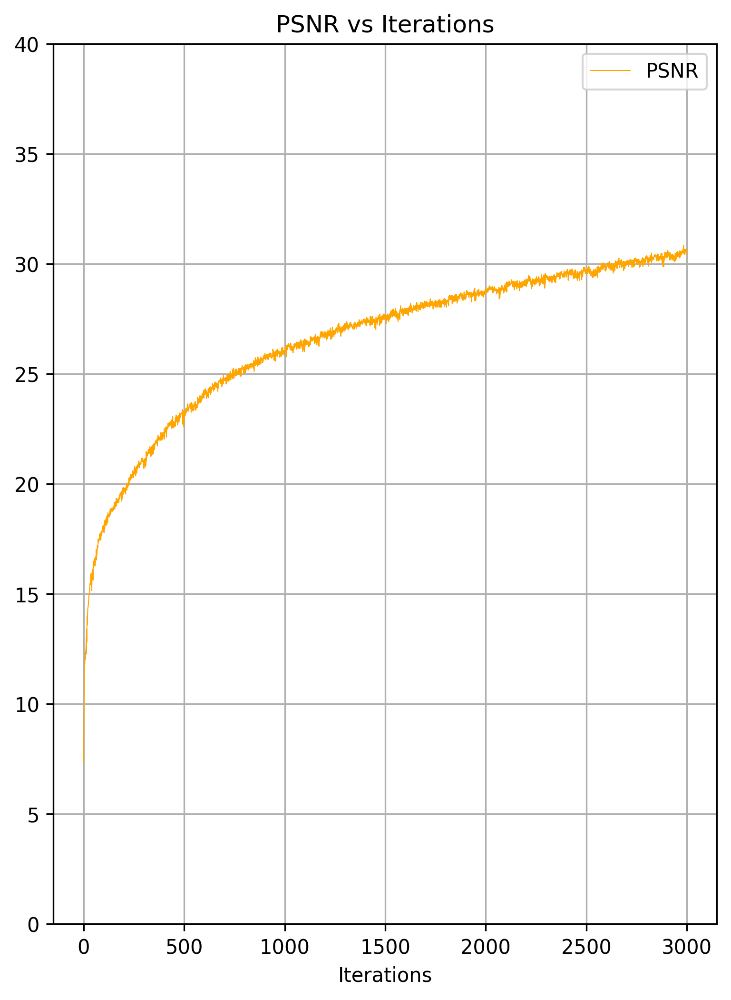

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(nrows=1, figsize=(6, 8), dpi=300)

if not isinstance(axs, np.ndarray):
    axs = np.array([axs])

axs[0].plot(psrn_array[:, 0], psrn_array[:, 1], label='PSNR', linewidth=0.5, color='orange' )
axs[0].set_title('PSNR vs Iterations')
axs[0].set_ylim(0.000, 40)
axs[0].grid(True)
axs[0].legend()

plt.xlabel('Iterations')
plt.show()

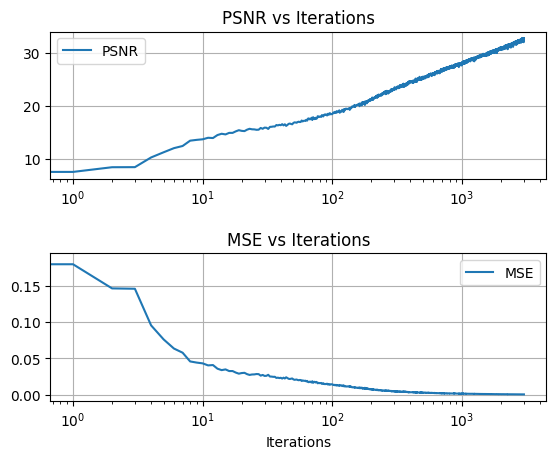

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


fig, axs = plt.subplots(nrows=2)
plt.subplots_adjust(hspace=0.5)
axs[0].plot(psrn_array[:, 0], psrn_array[:, 1], label='PSNR')
axs[0].set_title('PSNR vs Iterations')
axs[0].set_xscale('log')
axs[0].grid(True)
axs[0].legend()

axs[1].plot(mse_array[:, 0], mse_array[:, 1], label='MSE')
axs[1].set_title('MSE vs Iterations')
axs[1].set_xscale('log')
axs[1].grid(True)
axs[1].legend()

plt.xlabel('Iterations')
plt.show()


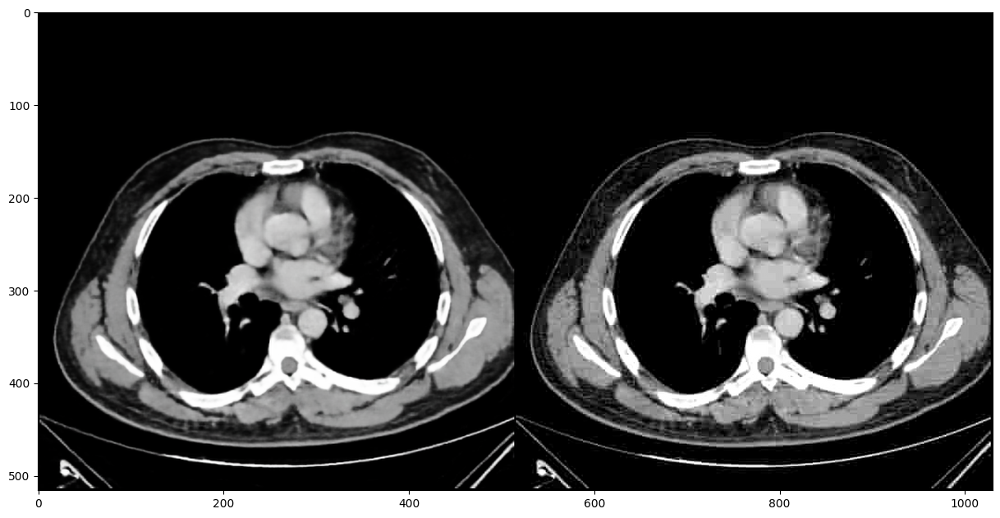

In [ ]:
out_np = torch_to_np(net(net_input))

q = plot_image_grid([np.clip(out_np, 0, 1), img_np], factor=13);